### Problem Statement

We shall try to create a Recommender System to show personalized movie recommendations based on ratings given by a user and other users similar to them in order to improve user experience.

**Data Dictionary:**

==============================================================================================


**RATINGS FILE DESCRIPTION**

==============================================================================================

All ratings are contained in the file "ratings.dat" and are in the following format:

 - UserID::MovieID::Rating::Timestamp

 - UserIDs range between 1 and 6040

 - MovieIDs range between 1 and 3952

 - Ratings are made on a 5-star scale (whole-star ratings only)

 - Timestamp is represented in seconds

 - Each user has at least 20 ratings

==============================================================================================


**USERS FILE DESCRIPTION**

==============================================================================================

User information is in the file "users.dat" and is in the following format:

 - UserID::Gender::Age::Occupation::Zip-code
 - All demographic information is provided voluntarily by the users and is not checked for accuracy.
 - Only users who have provided some demographic information are included in this data set.
 - Gender is denoted by a "M" for male and "F" for female

 - Age is chosen from the following ranges:
    - 1: "Under 18"
    - 18: "18-24"
    - 25: "25-34"
    - 35: "35-44"
    - 45: "45-49"
    - 50: "50-55"
    - 56: "56+"

 - Occupation is chosen from the following choices:
    - 0: "other" or not specified
    - 1: "academic/educator"
    - 2: "artist"
    - 3: "clerical/admin"
    - 4: "college/grad student"
    - 5: "customer service"
    - 6: "doctor/health care"
    - 7: "executive/managerial"
    - 8: "farmer"
    - 9: "homemaker"
    - 10: "K-12 student"
    - 11: "lawyer"
    - 12: "programmer"
    - 13: "retired"
    - 14: "sales/marketing"
    - 15: "scientist"
    - 16: "self-employed"
    - 17: "technician/engineer"
    - 18: "tradesman/craftsman"
    - 19: "unemployed"
    - 20: "writer"


==============================================================================================


**MOVIES FILE DESCRIPTION**

==============================================================================================

Movie information is in the file "movies.dat" and is in the following format:

- MovieID::Title::Genres

- Titles are identical to titles provided by the IMDB (including year of release)

- Genres are pipe-separated and are selected from the following genres:

    - Action
    - Adventure
    - Animation
    - Children's
    - Comedy
    - Crime
    - Documentary
    - Drama
    - Fantasy
    - Film-Noir
    - Horror
    - Musical
    - Mystery
    - Romance
    - Sci-Fi
    - Thriller
    - War
    - Western

**Approach** : We'll build a recommender system that is going to recommend movies to a user based on their preferences as well as choices of other users who are similar to them. 

**Recommender System** : A recommender engine or recommender system is a subclass of information filtering system that seeks to predict the "rating" or "preference" a user would give to an item.

**Types of Recommender Systems** : Recommender systems make use of either *Content-based* or *Collborative filtering* systems or hybrid/combination of both. 

**Collaborative Filtering** : Collaborative filtering is based on the assumption that people who agreed in the past will agree in the future, and that they will like similar kinds of items as they liked in the past. The system generates recommendations only using the information about rating profiles for different users or items. By locating peer users/items with a rating history similar to the current user or team, they generate recommendations using this neighborohod. 

**Content-based Filtering** : Content-based filtering methods are based on a description of the item and a profile of the user's preferences. These methods are best suited to situations where there is known data on an item (name, location, description, etc) but not on the user. Content-based recommenders treat recommendation as a user-specific classification problem and learn a classifier for the user's likes and dislikes based on the item's features.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import sparse
from scipy.stats import pearsonr
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.neighbors import NearestNeighbors
import warnings
from pylab import rcParams

### Formatting the Data

In [2]:
movies=pd.read_fwf('MoviesData/movies.dat', encoding='ISO-8859-1')
ratings=pd.read_fwf('MoviesData/ratings.dat', encoding='ISO-8859-1')
users=pd.read_fwf('MoviesData/users.dat', encoding='ISO-8859-1')

**Movies**

In [3]:
movies.head()

,Movie ID::Title::Genres,Unnamed: 1,Unnamed: 2
0,1::Toy Story (1995)::Animation|Children's|Comedy,NaN,NaN
1,2::Jumanji (1995)::Adventure|Children's|Fantasy,NaN,NaN
2,3::Grumpier Old Men (1995)::Comedy|Romance,NaN,NaN
3,4::Waiting to Exhale (1995)::Comedy|Drama,NaN,NaN
4,5::Father of the Bride Part II (1995)::Comedy,NaN,NaN


In [4]:
movies.drop(columns=['Unnamed: 1', 'Unnamed: 2'], axis=1, inplace=True)

In [5]:
delimiter = '::'
movies = movies['Movie ID::Title::Genres'].str.split(delimiter, expand=True)
movies.columns = ['MovieID', 'Title', 'Genres']

In [6]:
movies.sample(5)

,MovieID,Title,Genres
466,470,House Party 3 (1994),Comedy
2482,2551,Dead Ringers (1988),Drama|Thriller
1873,1942,All the King's Men (1949),Drama
3033,3102,Jagged Edge (1985),Thriller
1440,1467,Salut cousin! (1996),Comedy|Drama


**Ratings**

In [7]:
ratings.head()

,UserID::MovieID::Rating::Timestamp
0,1::1193::5::978300760
1,1::661::3::978302109
2,1::914::3::978301968
3,1::3408::4::978300275
4,1::2355::5::978824291


In [8]:
ratings = ratings['UserID::MovieID::Rating::Timestamp'].str.split(delimiter, expand=True)
ratings.columns = ['UserID','MovieID','Rating','Timestamp']

In [9]:
ratings.head(5)

,UserID,MovieID,Rating,Timestamp
0,1,1193,5,978300760
1,1,661,3,978302109
2,1,914,3,978301968
3,1,3408,4,978300275
4,1,2355,5,978824291


**Users**

In [10]:
users.head()

,UserID::Gender::Age::Occupation::Zip-code
0,1::F::1::10::48067
1,2::M::56::16::70072
2,3::M::25::15::55117
3,4::M::45::7::02460
4,5::M::25::20::55455


In [11]:
users = users['UserID::Gender::Age::Occupation::Zip-code'].str.split(delimiter, expand=True)
users.columns = ['UserID','Gender','Age','Occupation','Zip-code']

In [12]:
users.Age.value_counts()

25    2096
35    1193
18    1103
45     550
50     496
56     380
1      222
Name: Age, dtype: int64

In [13]:
users.replace(
    {'Age':{
        '1' : 'Under 18',
        '18' : '18-24',
        '25' : '25-34',
        '35' : '35-44',
        '45' : '45-49',
        '50' : '50-55',
        '56' : '56 Above'
    }}, inplace=True
)

In [14]:
users.Occupation.value_counts()

4     759
0     711
7     679
1     528
17    502
12    388
14    302
20    281
2     267
16    241
6     236
10    195
3     173
15    144
13    142
11    129
5     112
9      92
19     72
18     70
8      17
Name: Occupation, dtype: int64

In [15]:
users.replace(
    {'Occupation':{
        '0' :  "other",
        '1' : "academic/educator",
        '2' : "artist",
        '3' : "clerical/admin",
        '4' : "college/grad student",
        '5' : "customer service",
        '6' : "doctor/health care",
        '7' : "executive/managerial",
        '8' : "farmer",
        '9' : "homemaker",
        '10' : "K-12 student",
        '11' : "lawyer",
        '12' : "programmer",
        '13' : "retired",
        '14' : "sales/marketing",
        '15' : "scientist",
        '16' : "self-employed",
        '17' : "technician/engineer",
        '18' : "tradesman/craftsman",
        '19' : "unemployed",
        '20' : "writer"
    }}, inplace=True
)

In [16]:
users.head()

,UserID,Gender,Age,Occupation,Zip-code
0,1,F,Under 18,K-12 student,48067
1,2,M,56 Above,self-employed,70072
2,3,M,25-34,scientist,55117
3,4,M,45-49,executive/managerial,02460
4,5,M,25-34,writer,55455


**Merging the Dataframes**

In [17]:
df_1 = pd.merge(movies, ratings, how='inner', on='MovieID')
df_1.head()

,MovieID,Title,Genres,UserID,Rating,Timestamp
0,1,Toy Story (1995),Animation|Children's|Comedy,1,5,978824268
1,1,Toy Story (1995),Animation|Children's|Comedy,6,4,978237008
2,1,Toy Story (1995),Animation|Children's|Comedy,8,4,978233496
3,1,Toy Story (1995),Animation|Children's|Comedy,9,5,978225952
4,1,Toy Story (1995),Animation|Children's|Comedy,10,5,978226474


In [18]:
df_2 = pd.merge(df_1, users, how='inner', on='UserID')
df_2.head()

,MovieID,Title,Genres,UserID,Rating,Timestamp,Gender,Age,Occupation,Zip-code
0,1,Toy Story (1995),Animation|Children's|Comedy,1,5,978824268,F,Under 18,K-12 student,48067
1,48,Pocahontas (1995),Animation|Children's|Musical|Romance,1,5,978824351,F,Under 18,K-12 student,48067
2,150,Apollo 13 (1995),Drama,1,5,978301777,F,Under 18,K-12 student,48067
3,260,Star Wars: Episode IV - A New Hope (1977),Action|Adventure|Fantas,1,4,978300760,F,Under 18,K-12 student,48067
4,527,Schindler's List (1993),Drama|War,1,5,978824195,F,Under 18,K-12 student,48067


In [19]:
data= df_2.copy(deep = True)
data.sample(10)

,MovieID,Title,Genres,UserID,Rating,Timestamp,Gender,Age,Occupation,Zip-code
655972,2863,"Hard Day's Night, A (1964)",Comedy|Musical,3477,5,967127138,F,50-55,academic/educator,10024
870146,648,Mission: Impossible (1996),Action|Adventure|Mystery,3112,3,978412690,M,18-24,programmer,98133
45939,2371,Fletch (1985),Comedy,549,5,976118451,M,25-34,doctor/health care,53217
900739,2640,Superman (1978),Action|Adventure|Sci-Fi,2455,3,974180542,M,35-44,executive/managerial,48197
604838,3489,Hook (1991),Adventure|Fantasy,3556,3,966808246,M,25-34,technician/engineer,03038
956484,3685,Prizzi's Honor (1985),Comedy|Drama|Romance,1547,4,1006875219,M,56 Above,retired,02115
875102,3791,Footloose (1984),Drama,4849,4,963420069,F,18-24,college/grad student,44515
129808,1617,L.A. Confidential (1997),Crime|Film-Noir|Mystery|Thriller,1335,4,974776539,M,35-44,other,14228
639851,422,Blink (1994),Thriller,1121,5,1007755476,M,56 Above,executive/managerial,78701
344650,913,"Maltese Falcon, The (1941)",Film-Noir|Mystery,3622,5,966568640,M,18-24,academic/educator,02446


## Exploratory Data Analysis

**Shape of the Dataset**

In [20]:
print("No. of rows : ", df_2.shape[0])
print("No. of columns : ", df_2.shape[1])

No. of rows :  1000209
No. of columns :  10


In [21]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000209 entries, 0 to 1000208
Data columns (total 10 columns):
 #   Column      Non-Null Count    Dtype 
---  ------      --------------    ----- 
 0   MovieID     1000209 non-null  object
 1   Title       1000209 non-null  object
 2   Genres      996144 non-null   object
 3   UserID      1000209 non-null  object
 4   Rating      1000209 non-null  object
 5   Timestamp   1000209 non-null  object
 6   Gender      1000209 non-null  object
 7   Age         1000209 non-null  object
 8   Occupation  1000209 non-null  object
 9   Zip-code    1000209 non-null  object
dtypes: object(10)
memory usage: 83.9+ MB


- There are some null values for the **Genre** column.
- The data type of all columns is 'object'.

### **Feature Engineering**

**Convert Rating to integer type**

In [22]:
data['Rating'] = data['Rating'].astype('int32')

**Convert Timestamp column from object to Datetime type**

In [23]:
data['Datetime'] = pd.to_datetime(data['Timestamp'], unit = 's')

**Extract release year information from Title column**

In [24]:
data['ReleaseYear'] = data['Title'].str.rsplit(' ', 1).str[1]
data['ReleaseYear'] = data['ReleaseYear'].str.lstrip('(').str.rstrip(')')

/var/folders/1s/mgxysld95k99xdrvq52v_pp40000gn/T/ipykernel_9471/3082466648.py:1: FutureWarning: In a future version of pandas all arguments of StringMethods.rsplit except for the argument 'pat' will be keyword-only.
  data['ReleaseYear'] = data['Title'].str.rsplit(' ', 1).str[1]


In [25]:
data['ReleaseYear'].unique()

array(['1995', '1977', '1993', '1992', '1937', '1991', '1996', '1964',
       '1939', '1958', '1950', '1941', '1965', '1982', '1975', '1987',
       '1962', '1989', '1985', '1959', '1997', '1998', '1988', '1942',
       '1947', '1999', '1980', '1983', '1986', '1990', '2000', '1964):',
       '1994', '1978', '1961', '1984', '1972', '1976', '1981', '1973',
       '1974', '1940', 'Bo', '1952', '1954', '1953', '1944', '1968',
       '1957', '1946', '1949', '1951', '1963', '1971', '1979', '1967',
       '1966', '1948', '1933', '1970', '1969', '1930', '1955', '1956', '',
       '1920', '1925', '1938', '195', '1960', '1935', '1932', '1931',
       '1945', '1943', '1981):', '1934', '1936', '1929', 'the', '1926',
       'Arta', 'B', '1927', '19', '1922', 'Polar', '1919', '1921', "d'A",
       '1923', '1989):', '1928', '1995):', 'prendront', '1'], dtype=object)

In [26]:
pd.set_option('display.max_colwidth', -1)
condition = (data['ReleaseYear']=='Bo') | (data['ReleaseYear']=='the') | (data['ReleaseYear']=='Arta') | (data['ReleaseYear']=='B') | (data['ReleaseYear']=='19') | (data['ReleaseYear']=='Polar') | (data['ReleaseYear']=="d'A") | (data['ReleaseYear']=='prendront') | (data['ReleaseYear']=='1') | (data['ReleaseYear']=='195') | (data['ReleaseYear']=='')
data[condition][['Title','ReleaseYear']].drop_duplicates()

/var/folders/1s/mgxysld95k99xdrvq52v_pp40000gn/T/ipykernel_9471/730091853.py:1: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


,Title,ReleaseYear
432,Dr. Strangelove or: How I Learned to Stop Worrying and Love the Bo,Bo
708,March of the Wooden Soldiers (a.k.a. Laurel & Hardy in Toyland) (,
945,Seven Samurai (The Magnificent Seven) (Shichinin no samurai) (195,195
5058,Don't Be a Menace to South Central While Drinking Your Juice in the,the
8297,My Life and Times With Antonin Artaud (En compagnie d'Antonin Arta,Arta
10197,"Wonderful, Horrible Life of Leni Riefenstahl, The (Die Macht der B",B
13710,"Decline of Western Civilization Part II: The Metal Years, The (19",19
16134,"Lovers of the Arctic Circle, The (Los Amantes del Círculo Polar)",Polar
36700,"Garden of Finzi-Contini, The (Giardino dei Finzi-Contini, Il) (19",19
41302,Swept Away (Travolti da un insolito destino nell'azzurro mare d'A,d'A


In [27]:
data['ReleaseYear'].replace(
    ['1964):', '1981):', '1989):', '1995):', "d'A", 'prendront', 'Polar', 'B', 'Arta', 'the', 'Bo', '1'],
    ['1964', '1981', '1989', '1995', '1974', '1998', '1998', '1993', '1993', '1996', '1964', '1970'], inplace=True
)

data.loc[data['Title'] == df_2.iloc[708]['Title'], 'ReleaseYear'] = '1934'
data.loc[data['Title'] == df_2.iloc[945]['Title'], 'ReleaseYear'] = '1954'
data.loc[data['Title'] == df_2.iloc[13710]['Title'], 'ReleaseYear'] = '1988'
data.loc[data['Title'] == df_2.iloc[36700]['Title'], 'ReleaseYear'] = '1970'
data.loc[data['Title'] == df_2.iloc[141599]['Title'], 'ReleaseYear'] = '1998'
data.loc[data['Title'] == df_2.iloc[171381]['Title'], 'ReleaseYear'] = '1980'

In [28]:
data['ReleaseYear'] = data['ReleaseYear'].astype('int32')

**Get only the Title from Title Information**

In [29]:
data['Title'] = data['Title'].str.rsplit(' ',1).str[0]

/var/folders/1s/mgxysld95k99xdrvq52v_pp40000gn/T/ipykernel_9471/46830795.py:1: FutureWarning: In a future version of pandas all arguments of StringMethods.rsplit except for the argument 'pat' will be keyword-only.
  data['Title'] = data['Title'].str.rsplit(' ',1).str[0]


**Binning the Release Year to get Release Decade**

In [30]:
bins = [1919, 1929, 1939, 1949, 1959, 1969, 1979, 1989, 2000]
labels = ["20s", "30s", "40s", "50s", "60s", "70s", "80s", "90s"]
data['ReleaseDec'] = pd.cut(data['ReleaseYear'], bins=bins, labels=labels)

In [31]:
data.head()

,MovieID,Title,Genres,UserID,Rating,Timestamp,Gender,Age,Occupation,Zip-code,Datetime,ReleaseYear,ReleaseDec
0,1,Toy Story,Animation|Children's|Comedy,1,5,978824268,F,Under 18,K-12 student,48067,2001-01-06 23:37:48,1995,90s
1,48,Pocahontas,Animation|Children's|Musical|Romance,1,5,978824351,F,Under 18,K-12 student,48067,2001-01-06 23:39:11,1995,90s
2,150,Apollo 13,Drama,1,5,978301777,F,Under 18,K-12 student,48067,2000-12-31 22:29:37,1995,90s
3,260,Star Wars: Episode IV - A New Hope,Action|Adventure|Fantas,1,4,978300760,F,Under 18,K-12 student,48067,2000-12-31 22:12:40,1977,70s
4,527,Schindler's List,Drama|War,1,5,978824195,F,Under 18,K-12 student,48067,2001-01-06 23:36:35,1993,90s


### Data Cleaning

**Checking Missing Values**

In [32]:
data.isna().sum()

MovieID        0   
Title          0   
Genres         4065
UserID         0   
Rating         0   
Timestamp      0   
Gender         0   
Age            0   
Occupation     0   
Zip-code       0   
Datetime       0   
ReleaseYear    0   
ReleaseDec     45  
dtype: int64

**Duplicates**

In [33]:
duplicate_rows = data[data.duplicated()]
print("No of duplicate rows : ",duplicate_rows.shape[0])

No of duplicate rows :  0


### Data Visualization

**Distribution of Movie Ratings**

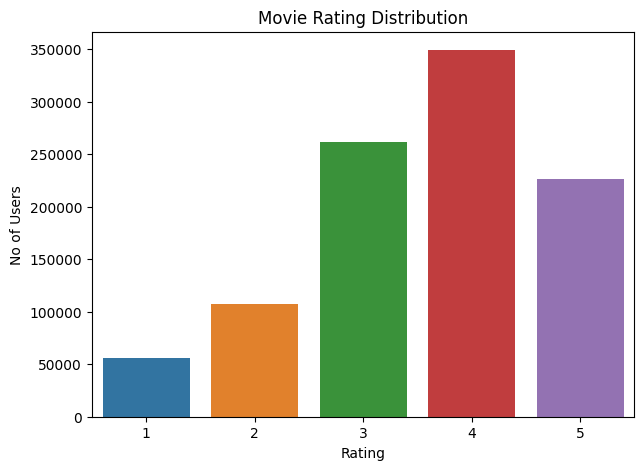

In [34]:
plt.figure(figsize=(7,5))
sns.countplot(x='Rating',data=data)
plt.title("Movie Rating Distribution")
plt.xlabel("Rating")
plt.ylabel("No of Users")
plt.show()

So we see that the rating with highest frequency is 4, followed by 3, 5, 2 and finally 1.

**Distribution by Age**

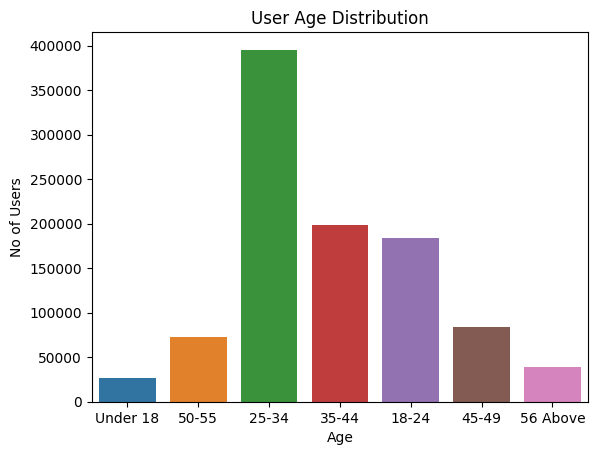

In [35]:
sns.countplot(x='Age',data=data)
plt.title("User Age Distribution")
plt.xlabel("Age")
plt.ylabel("No of Users")
plt.show()

- The highest number of users are in the 25-34 age group, followed by similar numbers for 35-44 and 18-24. So overall, the age groups 18-44 constitute the highest number of users.

- There are relatively less users in the 45-49 and 50-55 age groups.

- Finally, the age groups 56 and Above, and Under 18 have the least number of viewers. 

**Distribution by Gender**

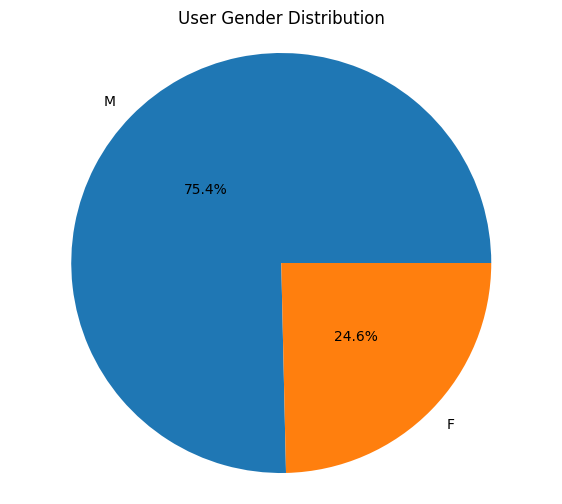

In [36]:
x = data['Gender'].value_counts().values
plt.figure(figsize=(7,6))
plt.pie(x, center = (0,0), radius=1.5, labels=data['Gender'].value_counts().index, autopct = '%1.1f%%', pctdistance=0.5)
plt.title("User Gender Distribution")
plt.axis('equal')
plt.show()

- 75.4% of users are Male and 24.6% users are Female.

**Distribution by Occupation**

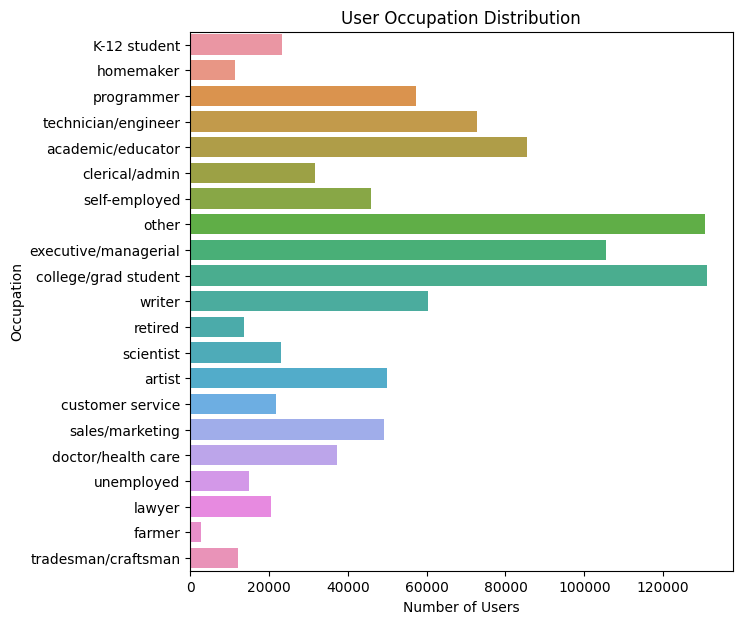

In [37]:
plt.figure(figsize=(7,7))
sns.countplot(y='Occupation',data=data)
plt.title("User Occupation Distribution")
plt.xlabel("Number of Users")
plt.ylabel("Occupation")
plt.show()

- College/Grad student is the most frequent category (along with unknown category 'others'), followed by Executive/Managerial and Academic/Educator.

- The least frequent categories would be Farmer, Homemaker and Tradesman/Craftsman.

**Distribution by Release Decade**

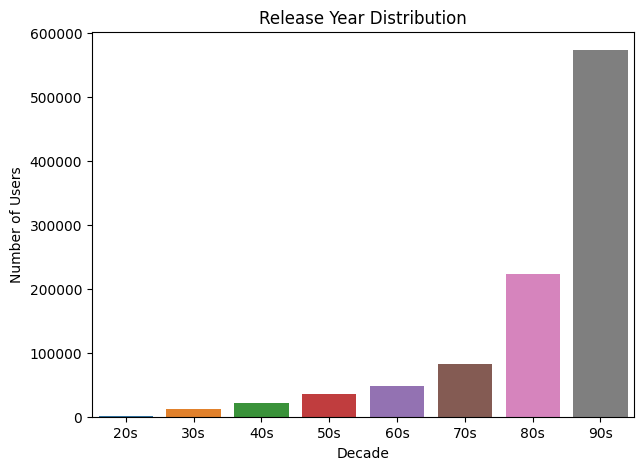

In [38]:
plt.figure(figsize=(7,5))
sns.countplot(x='ReleaseDec',data=data)
plt.title("Release Year Distribution")
plt.xlabel("Decade")
plt.ylabel("Number of Users")
plt.show()

- Most of the data comes from content that was released in the 90s, followed by 80s.

In [39]:
data['Title'].value_counts()

American Beauty                                       3428
Star Wars: Episode IV - A New Hope                    2991
Star Wars: Episode V - The Empire Strikes Back        2990
Star Wars: Episode VI - Return of the Jedi            2883
Jurassic Park                                         2672
                                                      ... 
Last of the High Kings, The (a.k.a. Summer Fling)     1   
Daens                                                 1   
Cheetah                                               1   
I Don't Want to Talk About It (De eso no se habla)    1   
Heaven's Burning                                      1   
Name: Title, Length: 3664, dtype: int64

### Grouping the Data

**Averaging Rating**

In [40]:
data.groupby(['Title'])['Rating'].mean().sort_values(ascending=False).head(10)

Title
Smashing Time                         5.0
Song of Freedom                       5.0
One Little Indian                     5.0
Ulysses (Ulisse)                      5.0
Baby, The                             5.0
Follow the Bitch                      5.0
Schlafes Bruder (Brother of Sleep)    5.0
Gate of Heavenly Peace, The           5.0
Bittersweet Motel                     5.0
Lured                                 5.0
Name: Rating, dtype: float64

**No. of Ratings**

In [41]:
data.groupby('Title')['Rating'].count().sort_values(ascending=False).head(10)

Title
American Beauty                                   3428
Star Wars: Episode IV - A New Hope                2991
Star Wars: Episode V - The Empire Strikes Back    2990
Star Wars: Episode VI - Return of the Jedi        2883
Jurassic Park                                     2672
Saving Private Ryan                               2653
Terminator 2: Judgment Day                        2649
Matrix, The                                       2590
Back to the Future                                2583
Silence of the Lambs, The                         2578
Name: Rating, dtype: int64

In [42]:
df = pd.DataFrame(data.groupby('Title')['Rating'].agg([('Avg rating', 'mean')]))
df['No. of ratings'] = pd.DataFrame(data.groupby('Title')['Rating'].count())

In [43]:
df.sample(10)

,Avg rating,No. of ratings
Title,,
American Gigolo,3.169492,295
Multiplicity,2.861925,239
"Jerky Boys, The",2.060606,66
Metropolitan,3.646465,198
Baraka,3.888889,45
"Dog of Flanders, A",3.250000,8
End of Days,2.629433,564
So I Married an Axe Murderer,3.384164,682
Friday the 13th Part 2,2.426901,171


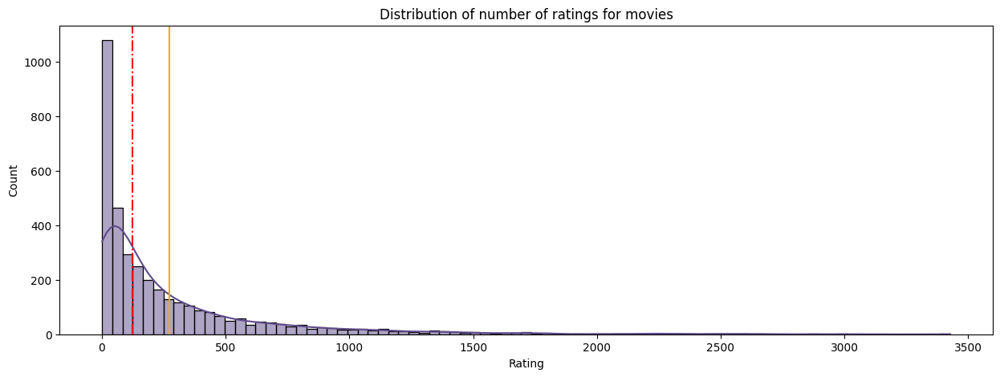

In [44]:
fig = plt.figure(figsize=(15,5))
ax = fig.add_subplot(111)
sns.histplot(data.groupby('Title')['Rating'].count(),kde=True,ax=ax,color='#5F4B8B')
ax.axvline(data.groupby('Title')['Rating'].count().mean(), color='orange', linestyle='-',linewidth=1.5)
ax.axvline(data.groupby('Title')['Rating'].count().median(), color='red', linestyle='-.',linewidth=1.5)
ax.set_title("Distribution of number of ratings for movies")
plt.show()

In [45]:
data.groupby('Title')['Rating'].count().median()

123.5

In [46]:
data.groupby('Title')['Rating'].count().mean()

272.9828056768559

In [47]:
df[df['No. of ratings'] > 1000].sort_values(by=['Avg rating'],ascending=False).head(5)

,Avg rating,No. of ratings
Title,,
"Shawshank Redemption, The",4.554558,2227
"Godfather, The",4.524966,2223
"Usual Suspects, The",4.517106,1783
Schindler's List,4.510417,2304
Raiders of the Lost Ark,4.477725,2514


The average number of ratings received by movies is 273 and the median number for ratings is 123.5. 

Next we also look at the top 5 movies that  have more than 1000 ratings and are also highly rated.

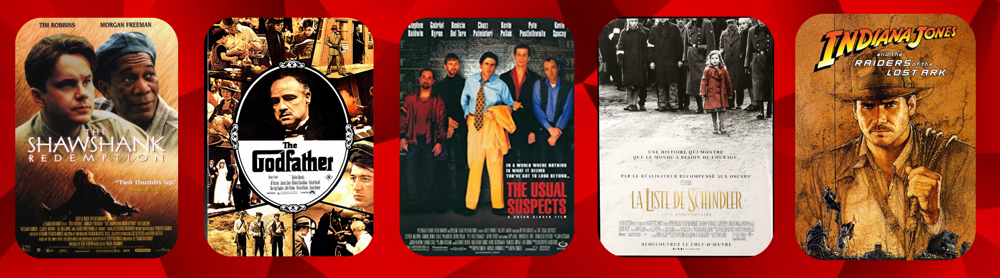

In [48]:
df_3 = data.groupby(['Title','Age'])['Rating'].agg(['mean','count']).reset_index()
df_3 = df_3[df_3['Age'] == 'Under 18']
df_3[df_3['count']>100].sort_values(by=['mean'],ascending=False).head()

,Title,Age,mean,count
18092,"Sixth Sense, The",Under 18,4.275229,109
18900,Star Wars: Episode IV - A New Hope,Under 18,4.267327,101
20425,Toy Story,Under 18,3.919643,112


Next, if we wanted to look at movies liked the most by those under 18, with at least 100 ratings, we would get these movies.

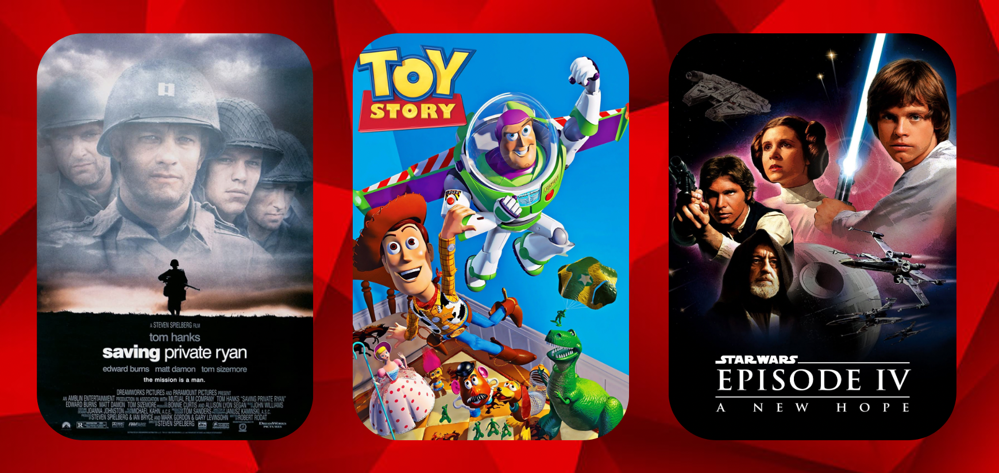

### Making Recommendations

#### Collaborative Filtering

Collaborative Filtering methods are classified as *memory based* and *model based* methods.

Also, there are two approaches to this method : A *user-based* approach and an *item-based* approach.

**Pivot Table**

We will create a pivot table of movie titles and user id.

In [49]:
mat = pd.pivot_table(data, index='UserID', columns='Title', values='Rating', aggfunc='mean')
mat.sample(10)

Title,"$1,000,000 Duck",'Night Mother,'Til There Was You,"'burbs, The",...And Justice for All,1-900,10 Things I Hate About You,101 Dalmatians,12 Angry Men,"13th Warrior, The",...,"Young Poisoner's Handbook, The",Young Sherlock Holmes,Young and Innocent,Your Friends and Neighbors,Zachariah,"Zed & Two Noughts, A",Zero Effect,Zero Kelvin (Kjærlighetens kjøtere),Zeus and Roxanne,eXistenZ
UserID,,,,,,,,,,,,,,,,,,,,,
4860,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
926,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1269,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1327,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1639,NaN,NaN,NaN,NaN,4.0,NaN,4.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0
1334,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2896,NaN,NaN,NaN,NaN,NaN,NaN,3.0,4.0,NaN,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2084,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1688,NaN,4.0,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


We will impute the NaN values using 0 rating.

In [50]:
mat.fillna(0, inplace=True)

In [51]:
mat.shape

(6040, 3664)

#### Pearson Correlation

Correlation is a measure that tells us how closely two variables move in the same or in opposite directions. A positive value indicates that they move in the same direction (i.e. if one increases, other also increases), where as a negative value indicates the opposite. 

The most popular correlation measure is the Pearson's correlation coefficient (*r*). This measures the degree of linear relationship between two variables and lies between -1 to +1. 

- *r* = 1 indicates perfect positive **linear** correlation.
- *r* =-1 indicates perfect negative **linear** correlation.
- *r* = 0 indicates no **linear** correlation.

#### Item-Based Approach

We will take the movie name from a user and see which 5 movies have maximum correlation with it. 

In [52]:
movie_name = "Liar Liar"
movie_rating = mat[movie_name]

In [53]:
similar_movies = mat.corrwith(movie_rating)

In [54]:
sim_df = pd.DataFrame(similar_movies, columns=['Correlation'])
sim_df.sort_values('Correlation', ascending=False, inplace=True)

In [55]:
sim_df.iloc[1:, :].head()

,Correlation
Title,
Mrs. Doubtfire,0.499927
Dumb & Dumber,0.459601
Ace Ventura: Pet Detective,0.458654
Home Alone,0.455967
"Wedding Singer, The",0.429222


It seems that Google recommendation Engine also provides us similar recommendations as we obtained for the movie "Mrs Doubtfire".

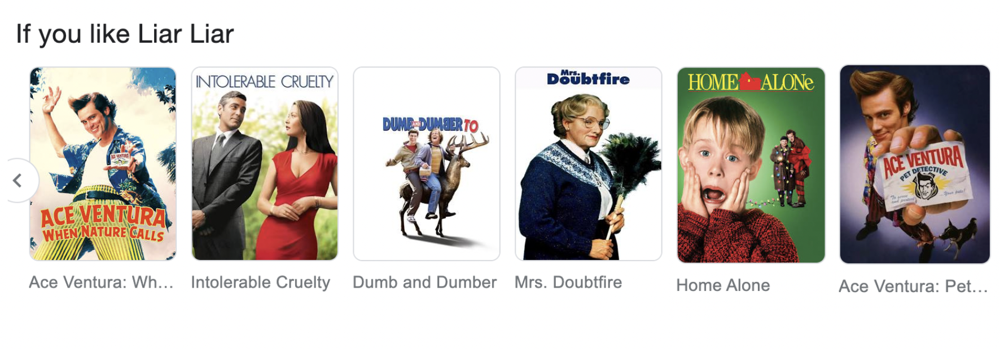

#### Cosine Similarity

Cosine similarity is a measure of similarity between two sequences of numbers. Those sequences can be considered vectors in higher dimensional space and the cosine similarity is defined as the cosine of the angle between them, i.e., the dot product of the vectors divided by the product of their lengths.

Cosine similarity lies in the interval [-1,1]. For example, two parallel vectors have cosine similarity of 1, while two anti parallel vectors have cosine similarity of -1. Two orthogonal vectors have cosine similarity of 0. 

In [56]:
item_sim = cosine_similarity(mat.T)

In [57]:
item_sim

array([[1.        , 0.07235746, 0.03701053, ..., 0.        , 0.12024178,
        0.02700277],
       [0.07235746, 1.        , 0.11528952, ..., 0.        , 0.        ,
        0.07780705],
       [0.03701053, 0.11528952, 1.        , ..., 0.        , 0.04752635,
        0.0632837 ],
       ...,
       [0.        , 0.        , 0.        , ..., 1.        , 0.        ,
        0.04564448],
       [0.12024178, 0.        , 0.04752635, ..., 0.        , 1.        ,
        0.04433508],
       [0.02700277, 0.07780705, 0.0632837 , ..., 0.04564448, 0.04433508,
        1.        ]])

**Item similarity Matrix**

In [58]:
item_sim_mat = pd.DataFrame(item_sim, index=mat.columns, columns=mat.columns)
item_sim_mat.head()

Title,"$1,000,000 Duck",'Night Mother,'Til There Was You,"'burbs, The",...And Justice for All,1-900,10 Things I Hate About You,101 Dalmatians,12 Angry Men,"13th Warrior, The",...,"Young Poisoner's Handbook, The",Young Sherlock Holmes,Young and Innocent,Your Friends and Neighbors,Zachariah,"Zed & Two Noughts, A",Zero Effect,Zero Kelvin (Kjærlighetens kjøtere),Zeus and Roxanne,eXistenZ
Title,,,,,,,,,,,,,,,,,,,,,
"$1,000,000 Duck",1.000000,0.072357,0.037011,0.079291,0.060838,0.00000,0.058619,0.189843,0.094785,0.058418,...,0.038725,0.076474,0.000000,0.044074,0.0,0.045280,0.039395,0.000000,0.120242,0.027003
'Night Mother,0.072357,1.000000,0.115290,0.115545,0.159526,0.00000,0.076798,0.137135,0.111413,0.046135,...,0.053010,0.087828,0.063758,0.135962,0.0,0.091150,0.074787,0.000000,0.000000,0.077807
'Til There Was You,0.037011,0.115290,1.000000,0.098756,0.066301,0.08025,0.127895,0.128523,0.079115,0.066598,...,0.029200,0.062893,0.000000,0.079187,0.0,0.022594,0.079261,0.000000,0.047526,0.063284
"'burbs, The",0.079291,0.115545,0.098756,1.000000,0.143620,0.00000,0.192191,0.250140,0.170719,0.197808,...,0.113386,0.207897,0.019962,0.138064,0.0,0.055704,0.161174,0.000000,0.033567,0.110525
...And Justice for All,0.060838,0.159526,0.066301,0.143620,1.000000,0.00000,0.075093,0.178928,0.205486,0.122431,...,0.089998,0.153006,0.067009,0.109029,0.0,0.086080,0.110867,0.074317,0.000000,0.111040


In [59]:
user_sim = cosine_similarity(mat)

In [60]:
user_sim

array([[1.        , 0.2547356 , 0.12396703, ..., 0.15926709, 0.11935626,
        0.12239079],
       [0.2547356 , 1.        , 0.25905171, ..., 0.16532118, 0.13302222,
        0.24788299],
       [0.12396703, 0.25905171, 1.        , ..., 0.20430203, 0.11352239,
        0.30693676],
       ...,
       [0.15926709, 0.16532118, 0.20430203, ..., 1.        , 0.18657496,
        0.18563871],
       [0.11935626, 0.13302222, 0.11352239, ..., 0.18657496, 1.        ,
        0.10827118],
       [0.12239079, 0.24788299, 0.30693676, ..., 0.18563871, 0.10827118,
        1.        ]])

**Nearest Neighbor**

In [61]:
csr_mat = sparse.csr_matrix(mat.T.values)
csr_mat

<3664x6040 sparse matrix of type '<class 'numpy.float64'>'
	with 997085 stored elements in Compressed Sparse Row format>

A sparse matrix or sparse array is a matrix in which most of the elements are zero. A compressed sparse row (CSR) matrix 'M' is represented by three (one-dimensional) arrays, that respectively contain non-zero values, the extents of rows and columns indices. Thus, the CSR format stores a sparse m x n matrix M in row form using (V, ROW_INDEX, COLUMN_INDEX).


For example, let us consider the following sparse matrix :-

[[1, 0, 0, 0, 0, 0],

 [0, 0, 2, 0, 0, 1],

 [0, 0, 0, 2, 0, 0]]



Sparse row matrix :-

[0, 0] 1

[1, 2] 2

[1, 5] 1 

[2, 3] 2


Next, we will be fitting the model with cosine similarity as the distance metric and 5 as the number of nearest neighbors.



In [62]:
knn = NearestNeighbors(n_neighbors=5, metric='cosine')
knn.fit(csr_mat)

NearestNeighbors(metric='cosine')

We'll now see how we can make recommendations based on a user's choice.

In [63]:
movie_name = "Shawshank Redemption, The"
movie_index = mat.columns.get_loc(movie_name)

In [64]:
distances, indices = knn.kneighbors(mat[movie_name].values.reshape(1, -1), n_neighbors = 6)

In [65]:
for i in range(0, len(distances.flatten())):
  if i == 0:
    print("Recommendation for the movie: {0}\n".format(movie_name))
  else:
    print("{0}, {1} with distance of {2}".format(i, mat.columns[indices.flatten()[i]], round(distances.flatten()[i], 3)))

Recommendation for the movie: Shawshank Redemption, The

1, Silence of the Lambs, The with distance of 0.319
2, Pulp Fiction with distance of 0.341
3, Fargo with distance of 0.344
4, Schindler's List with distance of 0.345
5, Good Will Hunting with distance of 0.368


Once again, we seem to be getting similar results from Google's recommendation Engine as well.

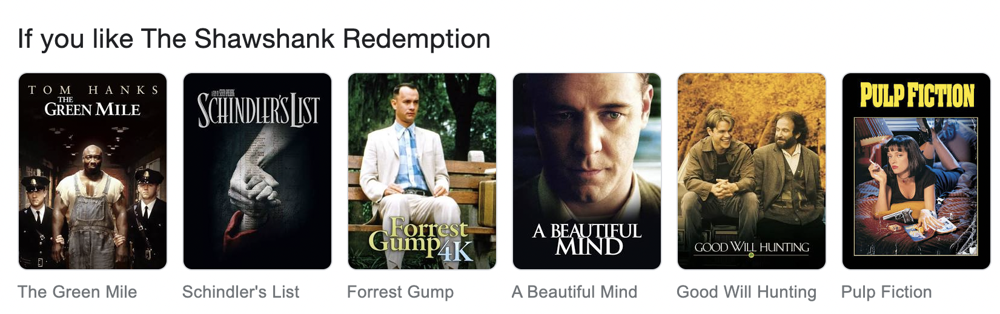

#### Matrix Factorization

First we need to create the embeddings for both the user as well as the item ( or movie, in our case ).

In [66]:
users = data.UserID.unique()
movies = data.MovieID.unique()

In [67]:
userid2idx = {o: i for i, o in enumerate(users)}
movieid2idx = {o: i for i, o in enumerate(movies)}

The number of dimensions (Latent Factors) in the embeddings could be a hyperparameter to deal with in the implementation of Collaborative Filtering.

In [68]:
data['UserID'] = data['UserID'].apply(lambda x: userid2idx[x])
data['MovieID'] = data['MovieID'].apply(lambda x: movieid2idx[x])
split = np.random.rand(len(data)) < 0.8
train = data[split]
valid = data[~split]
print(train.shape, valid.shape)

(799945, 13) (200264, 13)


In [69]:
n_movies = len(data['MovieID'].unique())
n_users = len(data['UserID'].unique())
n_latent_factors = 64 #hyperparameter

In [71]:
import keras
from tensorflow.keras.optimizers import Adam
from keras.layers import Input, Embedding, Flatten
from keras.layers import dot

Next we will specify the input expected to be embedded (both in user and item embeddings). Then use an embedding layer which expects the number of latent factors in the resulting embedding and also the number of users or items.

In [72]:
user_input = Input(shape=(1, ), name='user_input', dtype='int64')

In [73]:
user_embedding = Embedding(n_users, n_latent_factors, name= 'user_embedding')(user_input)

In [74]:
user_vec = Flatten(name='FlattenUsers')(user_embedding)

In [75]:
movie_input = Input(shape=(1, ), name='movie_input', dtype='int64')
movie_embedding = Embedding(n_movies, n_latent_factors, name= 'movie_embedding')(movie_input)
movie_vec = Flatten(name='FlattenMovies')(movie_embedding)

Then we take the 'Dot-Product' of both the embeddings using the merge layer.

In [76]:
sim = dot([user_vec, movie_vec], name='Similarity-Dot-Product', axes=1)
model = keras.models.Model([user_input, movie_input], sim)

Lastly, we make a keras model from the specified details.

In [77]:
model.compile(optimizer=Adam(learning_rate = 1e-4), loss='mse')

In [78]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 user_input (InputLayer)        [(None, 1)]          0           []                               
                                                                                                  
 movie_input (InputLayer)       [(None, 1)]          0           []                               
                                                                                                  
 user_embedding (Embedding)     (None, 1, 64)        386560      ['user_input[0][0]']             
                                                                                                  
 movie_embedding (Embedding)    (None, 1, 64)        237184      ['movie_input[0][0]']            
                                                                                              

**Model Training**

In [79]:
model_hist = model.fit([train.UserID, train.MovieID], train.Rating,
                       batch_size=128, epochs=28,
                       validation_data = ([valid.UserID, valid.MovieID], valid.Rating),
                       verbose=1)

Epoch 1/28


2022-12-04 13:58:00.861875: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


6250/6250 [==============================] - 17s 3ms/step - loss: 14.0119 - val_loss: 13.5682
Epoch 2/28
6250/6250 [==============================] - 16s 3ms/step - loss: 10.0717 - val_loss: 5.7443
Epoch 3/28
6250/6250 [==============================] - 16s 3ms/step - loss: 3.4148 - val_loss: 2.1347
Epoch 4/28
6250/6250 [==============================] - 17s 3ms/step - loss: 1.6265 - val_loss: 1.3129
Epoch 5/28
6250/6250 [==============================] - 17s 3ms/step - loss: 1.1359 - val_loss: 1.0384
Epoch 6/28
6250/6250 [==============================] - 17s 3ms/step - loss: 0.9566 - val_loss: 0.9273
Epoch 7/28
6250/6250 [==============================] - 17s 3ms/step - loss: 0.8790 - val_loss: 0.8756
Epoch 8/28
6250/6250 [==============================] - 17s 3ms/step - loss: 0.8406 - val_loss: 0.8491
Epoch 9/28
6250/6250 [==============================] - 17s 3ms/step - loss: 0.8192 - val_loss: 0.8336
Epoch 10/28
6250/6250 [==============================] - 17s 3ms/step - loss: 0.8

**Model Evaluation**

In [80]:
y_pred = model.predict([valid.UserID, valid.MovieID], verbose=0)
y_pred_class = np.argmax(y_pred, axis=-1)

Calculating the RMSE

In [81]:
from sklearn.metrics import mean_squared_error
rmse = mean_squared_error(valid.Rating, y_pred, squared=False)
print("Root Mean Squared Error : {:.3f}".format(rmse))

Root Mean Squared Error : 0.871


Calculating the MAPE

In [82]:
from sklearn.metrics import mean_absolute_percentage_error
mape = mean_absolute_percentage_error(valid.Rating, y_pred)
print("Mean Absolute Percentage Error : {:.3f}".format(mape))

Mean Absolute Percentage Error : 0.265


Plotting the model Loss

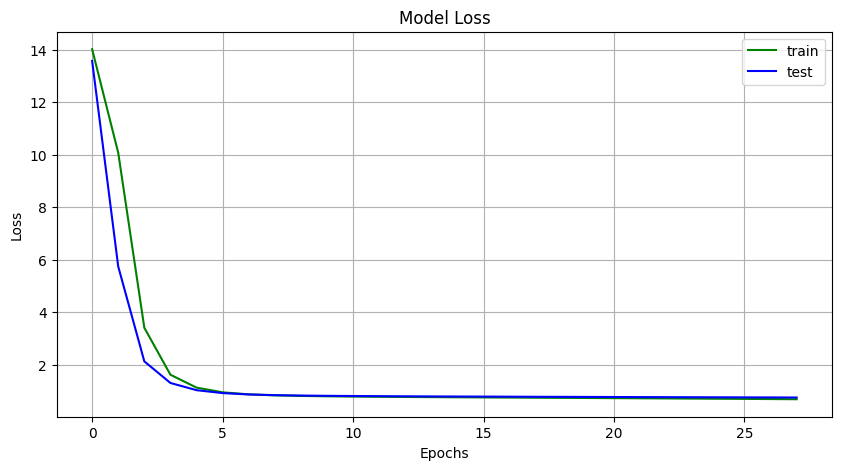

In [83]:
rcParams['figure.figsize'] = 10, 5
plt.plot(model_hist.history['loss'], 'g')
plt.plot(model_hist.history['val_loss'], 'b')
plt.title('Model Loss')
plt.ylabel('Loss') 
plt.xlabel('Epochs')
plt.legend(['train','test'], loc='upper right') 
plt.grid(True)
plt.show()

#### User-based Approach

Let's say we have given the user four movie names and asked them to rate the movies according to their preferences. 

In [84]:
mov_name = ['Mrs. Doubtfire', 'Dumb & Dumber', 'Ace Ventura: Pet Detective', 'Home Alone']

In [85]:
mov_id = []
for mov in mov_name:
  id = data[data['Title'] == mov]['MovieID'].iloc[0]
  mov_id.append(id)

In [86]:
mov_rating = [4.5, 4, 4, 4.5] #user's ratings

We will create a dataframe for the user's choices

In [87]:
user_choices = pd.DataFrame(
    {'MovieID':mov_id,
     'Title':mov_name,
     'Rating':mov_rating}
)
user_choices.sort_values(by='MovieID')

,MovieID,Title,Rating
2,316,Ace Ventura: Pet Detective,4.0
3,328,Home Alone,4.5
1,981,Dumb & Dumber,4.0
0,1012,Mrs. Doubtfire,4.5


Users who have watched the same movies as the new user

In [88]:
other_users = data[data['MovieID'].isin(user_choices['MovieID'].values)]
other_users = other_users[['MovieID', 'UserID', 'Rating']]
other_users['UserID'].nunique()

1466

Next, we will sort the old users by the count of most number of movies in common with the new user.

In [89]:
common_movies = other_users.groupby('UserID')
common_movies = sorted(common_movies, key = lambda x: len(x[1]), reverse=True)
common_movies[0]

(9,
       MovieID  UserID  Rating
 1687  981      9       1     
 1705  316      9       1     
 1738  1012     9       3     
 1749  328      9       2     )

In [90]:
top_users = common_movies[:100]

We will calculate a similarity score for each user using Person's Correlation Coefficient.

In [91]:
pearson_corr = {}

for user_id, movies in top_users:
  movies = movies.sort_values(by='MovieID')
  movie_list = movies.MovieID.values

  new_user_ratings = user_choices[user_choices['MovieID'].isin(movie_list)]['Rating'].values
  user_ratings = movies[movies['MovieID'].isin(movie_list)]['Rating'].values

  corr = pearsonr(new_user_ratings, user_ratings)
  pearson_corr[user_id] = corr[0]

/Users/anweshabasu/Library/Python/3.9/lib/python/site-packages/scipy/stats/_stats_py.py:4427: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


We will fetch the top 10 users with highest similarity indices.

In [92]:
pearson_df = pd.DataFrame(columns=['UserID','Similarity Index'], data = pearson_corr.items())
pearson_df = pearson_df.sort_values(by = 'Similarity Index', ascending=False)[:10]
pearson_df

,UserID,Similarity Index
72,717,1.000000
44,453,1.000000
22,281,1.000000
17,201,1.000000
30,356,0.904534
99,1088,0.707107
53,543,0.707107
38,409,0.707107
23,290,0.688247
51,515,0.688247


We will get all movies for these users and add weighted movie ratings.

In [93]:
users_rating = pearson_df.merge(data, on='UserID', how='inner')
users_rating['Weighted Rating'] = users_rating['Rating'] * users_rating['Similarity Index']
users_rating = users_rating[['UserID', 'MovieID', 'Rating', 'Similarity Index', 'Weighted Rating']]
users_rating

,UserID,MovieID,Rating,Similarity Index,Weighted Rating
0,717,0,5,1.000000,5.000000
1,717,296,3,1.000000,3.000000
2,717,966,3,1.000000,3.000000
3,717,593,3,1.000000,3.000000
4,717,848,3,1.000000,3.000000
...,...,...,...,...,...
6666,515,1831,3,0.688247,2.064742
6667,515,1707,1,0.688247,0.688247
6668,515,838,2,0.688247,1.376494
6669,515,591,3,0.688247,2.064742


Next, we will be calculating the average recommendation score and selecting items with the highest score.

In [94]:
#Calculate sum of similarity index and weighted rating for each movie
grouped_ratings = users_rating.groupby('MovieID').sum()[['Similarity Index', 'Weighted Rating']]

recommend_movies = pd.DataFrame()

#Add average recommendation score
#We are calculating the average recommendation score by dividing the Weighted Rating by the Similarity Index
recommend_movies['avg_recommend_score'] = grouped_ratings['Weighted Rating']/ grouped_ratings['Similarity Index']
recommend_movies['MovieID'] = grouped_ratings.index
recommend_movies = recommend_movies.reset_index(drop=True)

#Select movies with the highest score,i.e. 5
recommend_movies = recommend_movies[recommend_movies['avg_recommend_score']==5]

We'll take a look at 10 movies recommended based on the ratings given by existing users who are similar to the new user.

In [95]:
recommendations = data[data['MovieID'].isin(recommend_movies['MovieID'])][['MovieID', 'Title']].sample(10)
recommendations

,MovieID,Title
262382,347,"Maltese Falcon, The"
790118,1268,Muriel's Wedding
497905,814,Pit and the Pendulum
862482,1938,Five Easy Pieces
363171,155,North by Northwest
958415,155,North by Northwest
686538,1883,"Deer Hunter, The"
349098,2088,"Best Years of Our Lives, The"
738912,2375,Jean de Florette
518242,1168,Matilda


### Some Insights

1. The highest number of users are in the 25-34 age group, followed by similar numbers for 35-44 and 18-24. So overall, the age groups 18-44 constitute the highest number of users.

2. College/Grad student is the most frequent category of profession that has watched and rated the most movies (along with unknown category 'others'), followed by Executive/Managerial and Academic/Educator.

3. Most of the users in our dataset who’ve rated the movies are Male. 

4. Most of the movies present on our dataset were released in the 90s, followed by 80s.